# Import required libraries

In [81]:
# Importing necessary library

import time
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif

from sklearn.svm import SVC
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.random_projection import GaussianRandomProjection
from sklearn.metrics import ( precision_score,
                              accuracy_score,
                              recall_score,
                              confusion_matrix )
import warnings
warnings.filterwarnings("ignore")

In [82]:
df = pd.read_csv('log2.csv')
df.head()

,Source Port,Destination Port,NAT Source Port,NAT Destination Port,Action,Bytes,Bytes Sent,Bytes Received,Packets,Elapsed Time (sec),pkts_sent,pkts_received
0,57222,53,54587,53,allow,177,94,83,2,30,1,1
1,56258,3389,56258,3389,allow,4768,1600,3168,19,17,10,9
2,6881,50321,43265,50321,allow,238,118,120,2,1199,1,1
3,50553,3389,50553,3389,allow,3327,1438,1889,15,17,8,7
4,50002,443,45848,443,allow,25358,6778,18580,31,16,13,18


# Basic Analysis

In [83]:
# Missing values in percentage

round(df.isnull().sum() / len(df) * 100 , 2)

Source Port             0.0
Destination Port        0.0
NAT Source Port         0.0
NAT Destination Port    0.0
Action                  0.0
Bytes                   0.0
Bytes Sent              0.0
Bytes Received          0.0
Packets                 0.0
Elapsed Time (sec)      0.0
pkts_sent               0.0
pkts_received           0.0
dtype: float64

In [84]:
# Dataset column information

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65532 entries, 0 to 65531
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Source Port           65532 non-null  int64 
 1   Destination Port      65532 non-null  int64 
 2   NAT Source Port       65532 non-null  int64 
 3   NAT Destination Port  65532 non-null  int64 
 4   Action                65532 non-null  object
 5   Bytes                 65532 non-null  int64 
 6   Bytes Sent            65532 non-null  int64 
 7   Bytes Received        65532 non-null  int64 
 8   Packets               65532 non-null  int64 
 9   Elapsed Time (sec)    65532 non-null  int64 
 10  pkts_sent             65532 non-null  int64 
 11  pkts_received         65532 non-null  int64 
dtypes: int64(11), object(1)
memory usage: 6.0+ MB


In [86]:
# Basic statistical information

df.describe()

,Source Port,Destination Port,NAT Source Port,NAT Destination Port,Bytes,Bytes Sent,Bytes Received,Packets,Elapsed Time (sec),pkts_sent,pkts_received
count,65532.000000,65532.000000,65532.000000,65532.000000,6.553200e+04,6.553200e+04,6.553200e+04,6.553200e+04,65532.000000,65532.000000,65532.000000
mean,49391.969343,10577.385812,19282.972761,2671.049930,9.712395e+04,2.238580e+04,7.473815e+04,1.028660e+02,65.833577,41.399530,61.466505
std,15255.712537,18466.027039,21970.689669,9739.162278,5.618439e+06,3.828139e+06,2.463208e+06,5.133002e+03,302.461762,3218.871288,2223.332271
min,0.000000,0.000000,0.000000,0.000000,6.000000e+01,6.000000e+01,0.000000e+00,1.000000e+00,0.000000,1.000000,0.000000
25%,49183.000000,80.000000,0.000000,0.000000,6.600000e+01,6.600000e+01,0.000000e+00,1.000000e+00,0.000000,1.000000,0.000000
50%,53776.500000,445.000000,8820.500000,53.000000,1.680000e+02,9.000000e+01,7.900000e+01,2.000000e+00,15.000000,1.000000,1.000000
75%,58638.000000,15000.000000,38366.250000,443.000000,7.522500e+02,2.100000e+02,4.490000e+02,6.000000e+00,30.000000,3.000000,2.000000
max,65534.000000,65535.000000,65535.000000,65535.000000,1.269359e+09,9.484772e+08,3.208818e+08,1.036116e+06,10824.000000,747520.000000,327208.000000


In [87]:
# Label wise value count

label_class = df["Action"].value_counts().to_frame().reset_index()
fig = px.pie(
        label_class,
        values='Action',
        names='index',
        title='Prediction class label count'
)
fig.show()

# Data Preparation

In [88]:
# Rename the columns

col_names = {
    'Source Port': 'source_port',
    'Destination Port': 'destination_port',
    'NAT Source Port': 'NAT_source_port',
    'NAT Destination Port': 'NAT_destination_port',
    'Action': 'action',
    'Bytes': 'bytes',
    'Bytes Sent': 'bytes_sent',
    'Bytes Received': 'bytes_received',
    'Packets': 'packets',
    'Elapsed Time (sec)': 'elapsed_ime'
}
df.rename(columns=col_names, inplace=True)
print(f"After changing column name {df.columns}")

After changing column name Index(['source_port', 'destination_port', 'NAT_source_port',
       'NAT_destination_port', 'action', 'bytes', 'bytes_sent',
       'bytes_received', 'packets', 'elapsed_ime', 'pkts_sent',
       'pkts_received'],
      dtype='object')


In [89]:
# Combining label class
# The "rest-both" class has very less datapoints. Since the "Drop" has similar functionality, we can redefine "rest-both" class label also "Drop"

df["class"] = np.where(df["action"] == "reset-both", "drop", df["action"])
df["class"].unique()

array(['allow', 'drop', 'deny'], dtype=object)

In [90]:
# Creating new column to store the prediction label class numerical value using LabelEncoder

le = LabelEncoder()
df['label'] = le.fit_transform(df['class'])

print(f'Class: {le.classes_} and its respective labels {le.transform(le.classes_)}')

Class: ['allow' 'deny' 'drop'] and its respective labels [0 1 2]


# Exploratory data analysis

In [91]:
# Data distribution of all the input features

feature_list = ['source_port', 'destination_port', 'NAT_source_port', 'NAT_destination_port', 'elapsed_ime']

for column in feature_list:
    if df[column].dtype in ['int64', 'float64']:
        fig = px.histogram(df, x=df[column], color="class")
        fig.show()

In [92]:
# Corelation of source_port & destination_port pair to action

fig = px.scatter(df, x='source_port', y='destination_port', color="class")
fig.show()

In [93]:
# Corelation of NAT_source_port & NAT_destination_port pair to action

fig = px.scatter(df, x='NAT_source_port', y='NAT_destination_port', color="action")
fig.show()

In [94]:
# Corelation of NAT_source_port & NAT_destination_port pair to action except allow

fig = px.scatter(df, x='NAT_source_port', y='NAT_destination_port', color="action", size='label')
fig.show()

# Feature selection

In [95]:
# Spliting input feature & prediction labels

X = df.loc[:, ~df.columns.isin(['label', 'action'])],
y = df['class']

In [96]:
# Correlation matrix

df_corr = df.corr().round(2)
mask = np.zeros_like(df_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
df_corr_viz = df_corr.mask(mask).dropna(how='all').dropna('columns', how='all')
fig = px.imshow(df_corr_viz, text_auto=True)
fig.show()

In [97]:
# Compute absolute values of correlation coefficients
abs_correlation = df_corr.abs()

# Create a style object to highlight highly correlated values
def highlight_high_correlation(value):
    if value >= 0.8 :  # Set the threshold for highlighting
        return 'background-color: yellow'
    else:
        return ''

# Apply the style function to the correlation matrix
styled_correlation_matrix = df_corr.style.applymap(highlight_high_correlation)

# Display the styled correlation matrix
styled_correlation_matrix

,source_port,destination_port,NAT_source_port,NAT_destination_port,bytes,bytes_sent,bytes_received,packets,elapsed_ime,pkts_sent,pkts_received,label
source_port,1.000000,-0.330000,0.150000,-0.020000,0.000000,-0.000000,0.000000,-0.000000,-0.050000,-0.000000,-0.000000,0.040000
destination_port,-0.330000,1.000000,-0.280000,0.410000,-0.010000,0.000000,-0.010000,-0.010000,0.020000,-0.000000,-0.010000,0.090000
NAT_source_port,0.150000,-0.280000,1.000000,0.180000,0.010000,0.000000,0.020000,0.010000,0.140000,0.010000,0.020000,-0.690000
NAT_destination_port,-0.020000,0.410000,0.180000,1.000000,0.000000,0.010000,-0.000000,0.000000,0.220000,0.010000,0.000000,-0.220000
bytes,0.000000,-0.010000,0.010000,0.000000,1.000000,0.930000,0.830000,0.970000,0.150000,0.970000,0.850000,-0.010000
bytes_sent,-0.000000,0.000000,0.000000,0.010000,0.930000,1.000000,0.580000,0.890000,0.130000,0.970000,0.640000,-0.000000
bytes_received,0.000000,-0.010000,0.020000,-0.000000,0.830000,0.580000,1.000000,0.840000,0.140000,0.690000,0.950000,-0.020000
packets,-0.000000,-0.010000,0.010000,0.000000,0.970000,0.890000,0.840000,1.000000,0.150000,0.960000,0.920000,-0.020000
elapsed_ime,-0.050000,0.020000,0.140000,0.220000,0.150000,0.130000,0.140000,0.150000,1.000000,0.140000,0.140000,-0.170000
pkts_sent,-0.000000,-0.000000,0.010000,0.010000,0.970000,0.970000,0.690000,0.960000,0.140000,1.000000,0.770000,-0.010000


In [98]:
# Information gain calculates

importance = mutual_info_classif(
    X = np.asarray(df.loc[:, ~df.columns.isin(['action', 'class', 'label'])]),
    y = df['label'])
importance# Information gain calculates

array([0.31027188, 0.91582469, 0.6386549 , 0.63780883, 0.73323522,
       0.70632571, 0.5076206 , 0.56649826, 0.65052821, 0.21908294,
       0.50338609])

In [99]:
# Will choose only coorelated features

df = df[["source_port", "destination_port", "NAT_source_port", "NAT_destination_port", "elapsed_ime"]]
df.head()

,source_port,destination_port,NAT_source_port,NAT_destination_port,elapsed_ime
0,57222,53,54587,53,30
1,56258,3389,56258,3389,17
2,6881,50321,43265,50321,1199
3,50553,3389,50553,3389,17
4,50002,443,45848,443,16


# Model building

In [100]:
# Normalize the input data

scaler = MinMaxScaler()
X = scaler.fit_transform(df)

In [101]:
# Creating train test split for validation

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.3, random_state=0)

In [102]:
#Logistic Regression
lr_model = LogisticRegression()
lr_clf = lr_model.fit(x_train,y_train)
y_pred = lr_model.predict(x_test)

lr_report=classification_report(y_test,y_pred)
print(lr_report)

              precision    recall  f1-score   support

       allow       1.00      0.97      0.98     11329
        deny       0.98      0.90      0.94      4487
        drop       0.84      1.00      0.91      3844

    accuracy                           0.96     19660
   macro avg       0.94      0.95      0.94     19660
weighted avg       0.96      0.96      0.96     19660



In [103]:
Evaluation=pd.DataFrame(['LR'],columns=['Algorithm'])

Evaluation.loc[0,'Algorithm']='LR'
Evaluation.loc[0,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[0,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[0,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[0,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,LR,0.956511,0.956511,0.956511,0.956511


In [104]:
# Parameters grid
lr_param_grid = [
    {
        'penalty' : ['l2'],
        'C' : [1,3,5,10],
        'solver' : ['lbfgs','liblinear','sag','saga'],
        'max_iter' : [10, 50, 100]
    }
]

# Initilizing the Logistic Regression model
lr_model = LogisticRegression()

# Import Grid Search
clf = GridSearchCV(lr_model, param_grid = lr_param_grid, cv = 2, verbose=True, n_jobs=-1)

# Identifying best params with cross validation
lr_clf = clf.fit(x_train,y_train)

# Best hyper parameters
best_params = lr_clf.best_params_
print(f"Best Params {lr_clf.best_params_} with accurecy {lr_clf.score(X,y):.3f}")

# Retraing model with best hyper parameters
best_lr_model = LogisticRegression(**best_params)
# Make predictions on the test set
lr_clf = best_lr_model.fit(x_train,y_train)
y_pred = best_lr_model.predict(x_test)

lr_report=classification_report(y_test,y_pred)
print(lr_report)

Fitting 2 folds for each of 48 candidates, totalling 96 fits
Best Params {'C': 10, 'max_iter': 10, 'penalty': 'l2', 'solver': 'sag'} with accurecy 0.975
              precision    recall  f1-score   support

       allow       1.00      0.97      0.99     11329
        deny       0.98      0.96      0.97      4487
        drop       0.91      1.00      0.95      3844

    accuracy                           0.98     19660
   macro avg       0.96      0.98      0.97     19660
weighted avg       0.98      0.98      0.98     19660



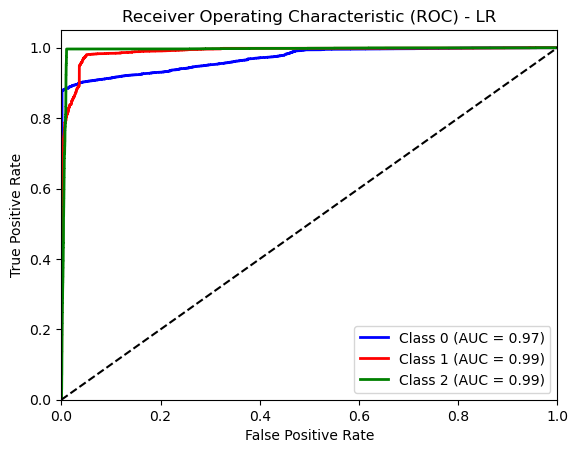

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize
from itertools import cycle

# Obtain confidence scores for each class using decision_function
y_scores = best_lr_model.decision_function(x_test)

# Binarize the true labels for ROC analysis
y_test_bin = label_binarize(y_test, classes=best_lr_model.classes_)

# Compute ROC curve and ROC AUC for each class
n_classes = len(best_lr_model.classes_)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_scores[:, i])

# Plot ROC curve for each class
plt.figure()
colors = cycle(['blue', 'red', 'green'])  # Use different colors for each class
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class %d (AUC = %0.2f)' % (i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - LR')
plt.legend(loc='lower right')
plt.show()


[[11045    80   204]
 [    7  4311   169]
 [    3    11  3830]]


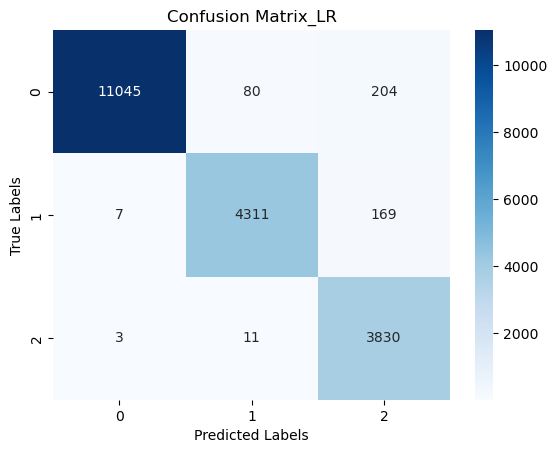

In [105]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")

plt.title("Confusion Matrix_LR")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [106]:
Evaluation.loc[1,'Algorithm']='LR_after_tuning'
Evaluation.loc[1,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[1,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[1,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[1,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,LR,0.956511,0.956511,0.956511,0.956511
1,LR_after_tuning,0.975890,0.975890,0.975890,0.975890


In [107]:
#Support vector machine
svc_model = SVC()
svc_clf = svc_model.fit(x_train,y_train)
y_pred = svc_clf.predict(x_test)

svc_report = classification_report(y_test,y_pred)

print(svc_report)

              precision    recall  f1-score   support

       allow       1.00      0.98      0.99     11329
        deny       0.97      0.97      0.97      4487
        drop       0.94      1.00      0.97      3844

    accuracy                           0.98     19660
   macro avg       0.97      0.98      0.98     19660
weighted avg       0.98      0.98      0.98     19660



In [108]:
Evaluation.loc[2,'Algorithm']='SVC'
Evaluation.loc[2,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[2,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[2,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[2,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,LR,0.956511,0.956511,0.956511,0.956511
1,LR_after_tuning,0.975890,0.975890,0.975890,0.975890
2,SVC,0.980163,0.980163,0.980163,0.980163


In [109]:
# Define the parameter grid for grid search
param_grid = {
    'C': [0.1,1],
    'gamma': [1, 0.1, 0.01],
    'kernel': ['rbf','sigmoid']
}

# Create an instance of the support vector machine classifier
svc_model = SVC()

# Perform grid search with cross-validation
grid_search = GridSearchCV(svc_model, param_grid, cv=5)
grid_search.fit(x_train, y_train)

# Get the best hyperparameters found by grid search
best_params = grid_search.best_params_

# Best hyper parameters
best_params = grid_search.best_params_
print(f"Best Params {grid_search.best_params_} with accurecy {grid_search.score(X,y):.3f}")

# Create a new Decision Tree classifier with the best hyperparameters
best_svm_model = SVC(**best_params)

# Fit the classifier with the training data
best_svm_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = best_svm_model.predict(x_test)

# Generate and print the classification report
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

       allow       1.00      0.98      0.99     11329
        deny       0.97      0.97      0.97      4487
        drop       0.94      1.00      0.97      3844

    accuracy                           0.98     19660
   macro avg       0.97      0.98      0.98     19660
weighted avg       0.98      0.98      0.98     19660



In [110]:
Evaluation.loc[3,'Algorithm']='SVC_after_tuning'
Evaluation.loc[3,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[3,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[3,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[3,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,LR,0.956511,0.956511,0.956511,0.956511
1,LR_after_tuning,0.975890,0.975890,0.975890,0.975890
2,SVC,0.980163,0.980163,0.980163,0.980163
3,SVC_after_tuning,0.980163,0.980163,0.980163,0.980163


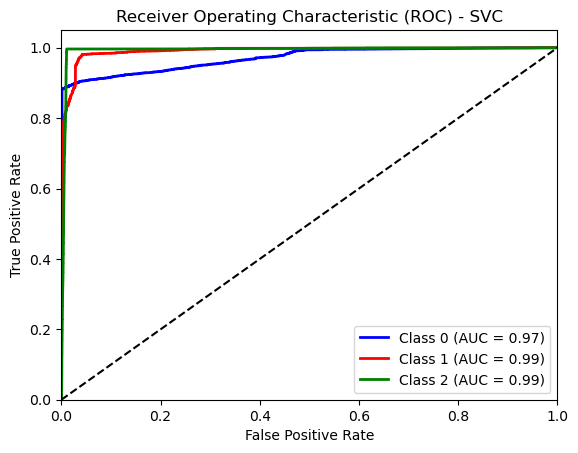

In [111]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize
from itertools import cycle

# Obtain confidence scores for each class using decision_function
y_scores = best_lr_model.decision_function(x_test)

# Binarize the true labels for ROC analysis
y_test_bin = label_binarize(y_test, classes=best_lr_model.classes_)

# Compute ROC curve and ROC AUC for each class
n_classes = len(best_lr_model.classes_)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_scores[:, i])

# Plot ROC curve for each class
plt.figure()
colors = cycle(['blue', 'red', 'green'])  # Use different colors for each class
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class %d (AUC = %0.2f)' % (i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - SVC')
plt.legend(loc='lower right')
plt.show()


[[11099   109   121]
 [    7  4341   139]
 [    3    11  3830]]


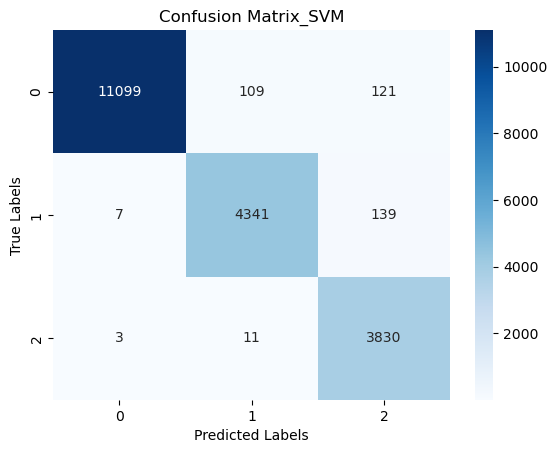

In [112]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")

plt.title("Confusion Matrix_SVM")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [113]:
#KNN Algorithm
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier()
knn_clf = knn_model.fit(x_train,y_train)
y_pred = knn_clf.predict(x_test)

knn_report=classification_report(y_test,y_pred)
print(knn_report)

              precision    recall  f1-score   support

       allow       1.00      0.99      1.00     11329
        deny       0.99      0.99      0.99      4487
        drop       1.00      1.00      1.00      3844

    accuracy                           0.99     19660
   macro avg       0.99      0.99      0.99     19660
weighted avg       0.99      0.99      0.99     19660



In [114]:
Evaluation.loc[4,'Algorithm']='KNN'
Evaluation.loc[4,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[4,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[4,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[4,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,LR,0.956511,0.956511,0.956511,0.956511
1,LR_after_tuning,0.975890,0.975890,0.975890,0.975890
2,SVC,0.980163,0.980163,0.980163,0.980163
3,SVC_after_tuning,0.980163,0.980163,0.980163,0.980163
4,KNN,0.993082,0.993082,0.993082,0.993082


In [115]:
# Define the parameter grid for grid search
param_grid = {
    'n_neighbors': [3, 5, 7],  # Different values for the number of neighbors
    'weights': ['uniform', 'distance'],  # Different weight functions to be tried
    'metric': ['euclidean', 'manhattan'],  # Different distance metrics to be tried
}

# Create an instance of the K Nearest Neighbors classifier
classifier = KNeighborsClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(classifier, param_grid, cv=5)
grid_search.fit(x_train, y_train)

# Get the best hyperparameters found by grid search
best_params = grid_search.best_params_

# Create a new K Nearest Neighbors classifier with the best hyperparameters
best_classifier = KNeighborsClassifier(**best_params)

# Fit the classifier with the training data
best_classifier.fit(x_train, y_train)

# Make predictions on the test set
y_pred = best_classifier.predict(x_test)

# Generate and print the classification report
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

       allow       1.00      1.00      1.00     11329
        deny       0.99      0.99      0.99      4487
        drop       0.99      1.00      0.99      3844

    accuracy                           0.99     19660
   macro avg       0.99      0.99      0.99     19660
weighted avg       0.99      0.99      0.99     19660



In [116]:
Evaluation.loc[5,'Algorithm']='KNN_after_tuning'
Evaluation.loc[5,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[5,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[5,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[5,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,LR,0.956511,0.956511,0.956511,0.956511
1,LR_after_tuning,0.975890,0.975890,0.975890,0.975890
2,SVC,0.980163,0.980163,0.980163,0.980163
3,SVC_after_tuning,0.980163,0.980163,0.980163,0.980163
4,KNN,0.993082,0.993082,0.993082,0.993082
5,KNN_after_tuning,0.994710,0.994710,0.994710,0.994710


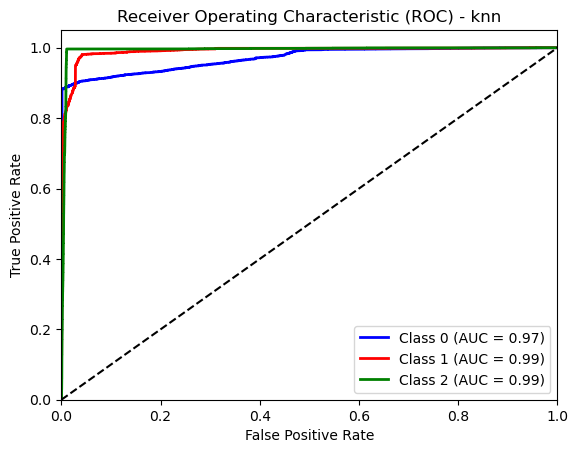

In [117]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize
from itertools import cycle

# Obtain confidence scores for each class using decision_function
y_scores = best_lr_model.decision_function(x_test)

# Binarize the true labels for ROC analysis
y_test_bin = label_binarize(y_test, classes=best_lr_model.classes_)

# Compute ROC curve and ROC AUC for each class
n_classes = len(best_lr_model.classes_)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_scores[:, i])

# Plot ROC curve for each class
plt.figure()
colors = cycle(['blue', 'red', 'green'])  # Use different colors for each class
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class %d (AUC = %0.2f)' % (i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - knn')
plt.legend(loc='lower right')
plt.show()


[[11291    33     5]
 [   31  4438    18]
 [    4    13  3827]]


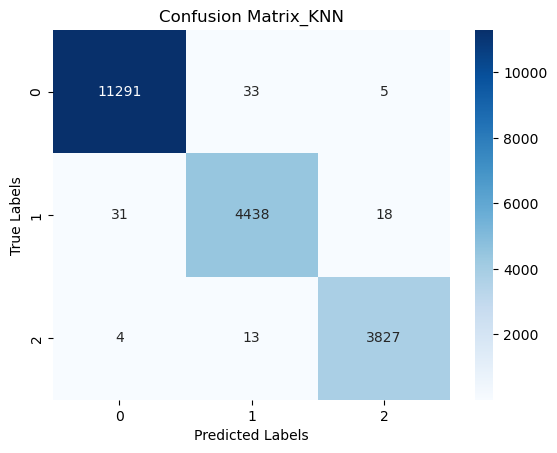

In [118]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")

plt.title("Confusion Matrix_KNN")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()